In [ ]:
!pip install geopandas
!pip install contextily

     |████████████████████████████████| 1.0 MB 5.1 MB/s 
     |████████████████████████████████| 15.4 MB 39.1 MB/s 
     |████████████████████████████████| 6.3 MB 40.6 MB/s 
     |████████████████████████████████| 19.3 MB 3.8 MB/s 


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
%matplotlib inline
import pandas as pd
import geopandas
import contextily
from shapely.geometry import Point
import matplotlib.pyplot as plt

**Leggere tutto il testo prima di iniziare a programmare**

**Utilizzare i dataset precedentemente scaricati e quello relativo ai parchi della Lombardia (allegato al presente post) per scrivere un notebook Python che:**

In [ ]:
province = geopandas.read_file("/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Mappa Italia/ProvCM01012021_g")
province

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
0,1,1,1,201,201,-,Torino,Torino,TO,Citta metropolitana,539249.811270,6.828137e+09,"POLYGON ((411015.006 5049970.983, 411266.039 5..."
1,1,1,2,0,2,Vercelli,-,Vercelli,VC,Provincia,418078.067821,2.082097e+09,"POLYGON ((438328.612 5087208.215, 439028.888 5..."
2,1,1,3,0,3,Novara,-,Novara,NO,Provincia,250242.112077,1.341318e+09,"POLYGON ((460929.542 5076320.298, 461165.259 5..."
3,1,1,4,0,4,Cuneo,-,Cuneo,CN,Provincia,490111.881318,6.898443e+09,"MULTIPOLYGON (((378673.492 4958865.159, 378928..."
4,1,1,5,0,5,Asti,-,Asti,AT,Provincia,315563.261771,1.508947e+09,"POLYGON ((425041.329 4997628.309, 424948.989 4..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
102,1,1,103,0,103,Verbano-Cusio-Ossola,-,Verbano-Cusio-Ossola,VB,Provincia,299029.117691,2.262164e+09,"POLYGON ((457749.464 5145501.795, 458662.395 5..."
103,1,3,108,0,108,Monza e della Brianza,-,Monza e della Brianza,MB,Provincia,126272.490811,4.055793e+08,"POLYGON ((519754.706 5065242.380, 520199.702 5..."
104,3,11,109,0,109,Fermo,-,Fermo,FM,Provincia,198635.321418,8.619365e+08,"POLYGON ((884760.019 4804406.440, 885511.011 4..."
105,4,16,110,0,110,Barletta-Andria-Trani,-,Barletta-Andria-Trani,BT,Provincia,237762.889058,1.542032e+09,"POLYGON ((1081237.144 4611047.023, 1081399.393..."


In [ ]:
parchi = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Parchi_regionali_e_nazionali_polygon.zip')
parchi

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
0,5,Parco Alpi Orobie Valtellinesi,18,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,18:Parco Alpi Orobie Valtellinesi,"POLYGON ((587577.037 5107497.548, 587615.036 5..."
1,6,Parco Alpi Orobie Bergamasche,17,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,17:Parco Alpi Orobie Bergamasche,"POLYGON ((586196.195 5100871.221, 586351.566 5..."
2,7,Parco Campo dei Fiori,9,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,9: Parco Campo dei Fiori,"POLYGON ((486537.216 5078441.081, 486530.341 5..."
3,8,Parco Alto Garda Bresciano,7,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,7: Parco Alto Garda Bresciano,"POLYGON ((617860.123 5053114.432, 617863.431 5..."
4,1,National Park (CH),99,0,Non valutato,1,Parco Nazionale,3,Area extranazionale,99:National Park (CH),"POLYGON ((584084.298 5161019.100, 583763.056 5..."
5,2,Parco Nazionale dello Stelvio (TN-BZ),97,0,Non valutato,1,Parco Nazionale,2,Area extraregionale,97:Parco Nazionale dello Stelvio (TN-BZ),"POLYGON ((611429.112 5154022.734, 612080.475 5..."
6,3,Parco Nazionale dello Stelvio,98,0,Non valutato,1,Parco Nazionale,1,Area Regionale,98:Parco Nazionale dello Stelvio,"POLYGON ((584084.298 5161019.100, 584083.048 5..."
7,4,Parco Adamello,4,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,4: Parco Adamello,"POLYGON ((617719.939 5125721.072, 617744.313 5..."
8,9,Parco Adda Nord,5,45,Parco fluviale e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,5: Parco Adda Nord,"POLYGON ((533258.682 5067541.607, 533248.433 5..."
9,15,Parco Valle del Ticino,1,1245,"Parco agricolo,forestale,fluviale e di cintura...",2,Parco Regionale,1,Area Regionale,1: Parco Valle del Ticino,"POLYGON ((476666.268 5067282.167, 476899.067 5..."


In [ ]:
comuni = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/Mappa Italia/Com01012021_g')
parchi

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
0,5,Parco Alpi Orobie Valtellinesi,18,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,18:Parco Alpi Orobie Valtellinesi,"POLYGON ((587577.037 5107497.548, 587615.036 5..."
1,6,Parco Alpi Orobie Bergamasche,17,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,17:Parco Alpi Orobie Bergamasche,"POLYGON ((586196.195 5100871.221, 586351.566 5..."
2,7,Parco Campo dei Fiori,9,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,9: Parco Campo dei Fiori,"POLYGON ((486537.216 5078441.081, 486530.341 5..."
3,8,Parco Alto Garda Bresciano,7,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,7: Parco Alto Garda Bresciano,"POLYGON ((617860.123 5053114.432, 617863.431 5..."
4,1,National Park (CH),99,0,Non valutato,1,Parco Nazionale,3,Area extranazionale,99:National Park (CH),"POLYGON ((584084.298 5161019.100, 583763.056 5..."
5,2,Parco Nazionale dello Stelvio (TN-BZ),97,0,Non valutato,1,Parco Nazionale,2,Area extraregionale,97:Parco Nazionale dello Stelvio (TN-BZ),"POLYGON ((611429.112 5154022.734, 612080.475 5..."
6,3,Parco Nazionale dello Stelvio,98,0,Non valutato,1,Parco Nazionale,1,Area Regionale,98:Parco Nazionale dello Stelvio,"POLYGON ((584084.298 5161019.100, 584083.048 5..."
7,4,Parco Adamello,4,23,Parco forestale e montano,2,Parco Regionale,1,Area Regionale,4: Parco Adamello,"POLYGON ((617719.939 5125721.072, 617744.313 5..."
8,9,Parco Adda Nord,5,45,Parco fluviale e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,5: Parco Adda Nord,"POLYGON ((533258.682 5067541.607, 533248.433 5..."
9,15,Parco Valle del Ticino,1,1245,"Parco agricolo,forestale,fluviale e di cintura...",2,Parco Regionale,1,Area Regionale,1: Parco Valle del Ticino,"POLYGON ((476666.268 5067282.167, 476899.067 5..."


**1. visualizzi i parchi di Milano e i comuni che vi fanno parte (vedi immagine allegata)**

In [ ]:
comuni_milano = comuni[comuni["COMUNE"] == "Milano"]
comuni_milano

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1882,1,3,15,215,215,15146,015146,Milano,None,1,79382.994008,1.807534e+08,"POLYGON ((513714.538 5042508.056, 513985.199 5..."


In [ ]:
parchi_milano = parchi[parchi.intersects(comuni_milano.geometry.squeeze())]
parchi_milano

,FID,NOME,COD_AREA,CLASSIF,DCLASSIF,TIPO,DTIPO,TIPO_AREA,DTIPO_AREA,COD_NOME,geometry
20,21,Parco Nord Milano,22,5,Parco di cintura metropolitana,2,Parco Regionale,1,Area Regionale,22:Parco Nord Milano,"POLYGON ((516502.662 5041742.040, 516403.321 5..."
21,22,Parco Sud Milano,23,15,Parco agricolo e di cintura metropolitana,2,Parco Regionale,1,Area Regionale,23:Parco Sud Milano,"POLYGON ((533691.079 5042919.602, 533758.703 5..."


In [ ]:
comuni_inter = comuni[comuni.intersects(parchi_milano.unary_union)]
comuni_inter

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1811,1,3,15,215,215,15002,015002,Abbiategrasso,None,0,43048.321516,4.777153e+07,"POLYGON ((493446.898 5029705.643, 493602.897 5..."
1812,1,3,15,215,215,15005,015005,Albairate,None,0,18919.829233,1.567417e+07,"POLYGON ((495595.883 5032525.624, 495661.881 5..."
1815,1,3,15,215,215,15010,015010,Arluno,None,0,18646.960825,1.278364e+07,"POLYGON ((496562.280 5041533.478, 496401.277 5..."
1816,1,3,15,215,215,15011,015011,Assago,None,0,12853.544196,8.397610e+06,"POLYGON ((511386.603 5029333.275, 511518.968 5..."
1817,1,3,15,215,215,15012,015012,Bareggio,None,0,15924.405593,1.130249e+07,"POLYGON ((499326.672 5038880.244, 499885.260 5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7465,1,3,98,0,98,98020,098020,Comazzo,None,0,22343.534930,1.277192e+07,"POLYGON ((534210.409 5035224.602, 534551.968 5..."
7484,1,3,98,0,98,98039,098039,Merlino,None,0,18053.583011,1.039029e+07,"POLYGON ((534698.954 5033625.792, 534731.476 5..."
7486,1,3,98,0,98,98041,098041,Mulazzano,None,0,22643.863100,1.529437e+07,"POLYGON ((530678.622 5027337.660, 530960.619 5..."
7500,1,3,98,0,98,98055,098055,Sordio,None,0,6681.722797,2.603890e+06,"POLYGON ((529834.629 5021137.707, 530206.624 5..."


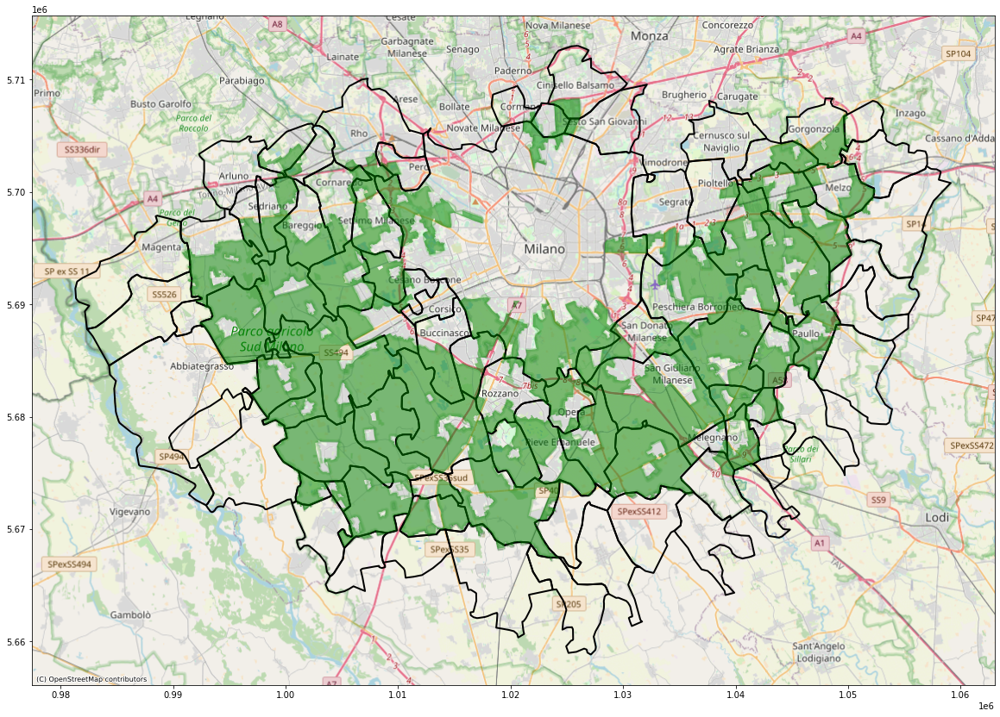

In [ ]:
ax = comuni_inter.to_crs(epsg=3857).plot(figsize= (20, 20), facecolor="none", edgecolor="k", linewidth=2)
parchi_milano.to_crs(epsg=3857).plot(ax=ax, facecolor='green', alpha=0.5)
contextily.add_basemap(ax, source=contextily.providers.OpenStreetMap.Mapnik)

**2. analogo al primo esercizio ma tracciando sulla mappa solo i quartieri di Milano attraversati da parchi (e non tutta la città)**

In [ ]:
quartieri_milano = geopandas.read_file('/content/drive/MyDrive/Colab Notebooks/4E INF/GEOpands/CSV/quartieri di Milano/ds964_nil_wm.zip')

In [ ]:
quartieri_attraversati = quartieri_milano[quartieri_milano.intersects(parchi_milano.to_crs(epsg=4326).unary_union)]
quartieri_attraversati

,ID_NIL,NIL,Valido_dal,Valido_al,Fonte,Shape_Leng,Shape_Area,OBJECTID,geometry
0,48,RONCHETTO SUL NAVIGLIO - Q.RE LODOVICO IL MORO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8723.368714,2.406306e+06,89,"POLYGON ((9.15422 45.43775, 9.15419 45.43707, ..."
1,64,TRENNO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,3309.998800,4.896921e+05,90,"POLYGON ((9.10623 45.49016, 9.10295 45.48939, ..."
4,84,PARCO NORD,05/02/2020,Vigente,Milano 2030 - PGT Approvato,11741.717005,1.532331e+06,93,"POLYGON ((9.20040 45.52848, 9.20055 45.52828, ..."
5,63,FIGINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5622.522341,1.424660e+06,94,"POLYGON ((9.08375 45.48485, 9.08280 45.48521, ..."
9,61,QUARTO CAGNINO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,4648.169991,9.863542e+05,98,"POLYGON ((9.11143 45.47640, 9.11193 45.47624, ..."
10,60,STADIO - IPPODROMI,05/02/2020,Vigente,Milano 2030 - PGT Approvato,8277.734101,3.435178e+06,99,"POLYGON ((9.13020 45.48464, 9.13075 45.48449, ..."
11,62,QUINTO ROMANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6962.785127,1.645797e+06,100,"POLYGON ((9.08375 45.48485, 9.08444 45.48459, ..."
20,83,BRUZZANO,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6441.288643,1.670440e+06,109,"POLYGON ((9.17808 45.53479, 9.17807 45.53439, ..."
23,47,CANTALUPA,05/02/2020,Vigente,Milano 2030 - PGT Approvato,5161.415348,9.266817e+05,112,"POLYGON ((9.16112 45.42589, 9.16270 45.42544, ..."
24,39,QUINTOSOLE,05/02/2020,Vigente,Milano 2030 - PGT Approvato,6740.830821,1.058525e+06,113,"POLYGON ((9.21047 45.39699, 9.21039 45.39698, ..."


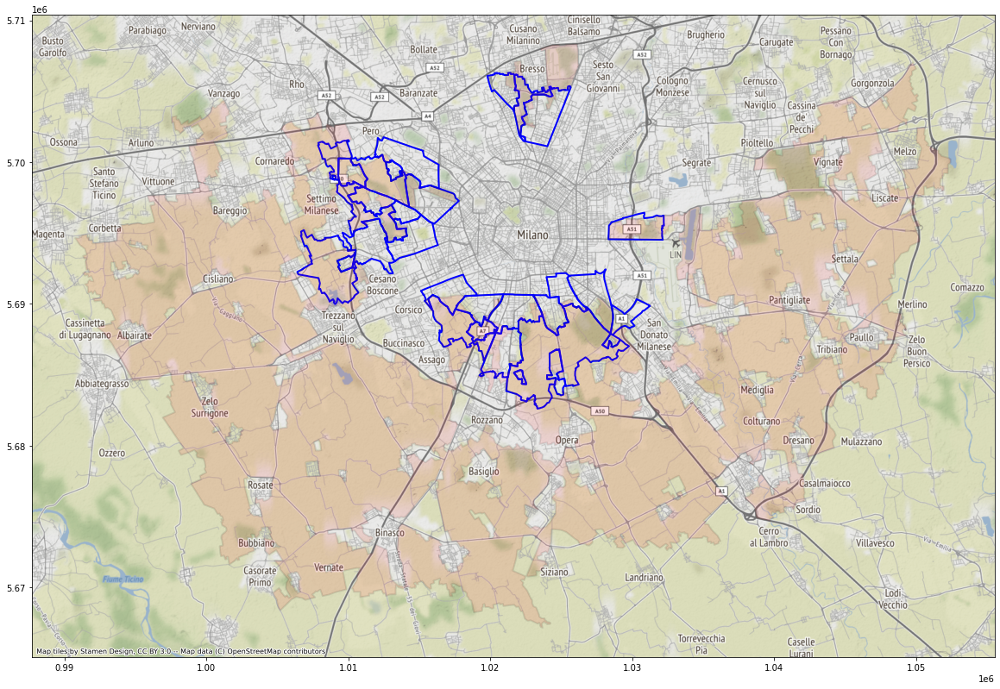

In [ ]:
ax = quartieri_attraversati.to_crs(epsg=3857).plot(figsize=(20, 20), facecolor="none", edgecolor="b", linewidth=2)
parchi_milano.to_crs(epsg=3857).plot(ax=ax, facecolor="red",linewidth=2, alpha=0.1, edgecolor="k")
contextily.add_basemap(ax=ax)

**3  dato il nome di un parco, avere la mappa del parco con i comuni che lo ospitano**

Inserire il nome di un parco lombardo: Parco Adda Nord


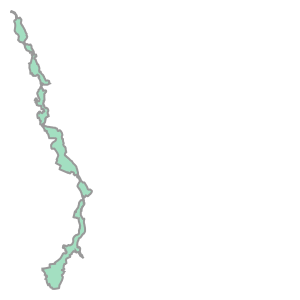

In [ ]:
parco = input('Inserire il nome di un parco lombardo: ')
parco = parchi[parchi["NOME"] == parco]
squeeze_parco = parco.geometry.squeeze()
squeeze_parco

In [ ]:
comuni_parco = comuni[comuni.intersects(squeeze_parco)]
comuni_parco

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,Shape_Area,geometry
1839,1,3,15,215,215,15059,015059,Cassano d'Adda,None,0,23356.056561,1.822284e+07,"POLYGON ((539808.556 5045117.527, 540293.552 5..."
1903,1,3,15,215,215,15178,015178,Pozzuolo Martesana,None,0,16885.693945,1.196128e+07,"POLYGON ((536138.584 5041707.553, 536095.582 5..."
1928,1,3,15,215,215,15221,015221,Trezzo sull'Adda,None,0,17718.022378,1.331480e+07,"POLYGON ((538943.562 5053137.469, 540179.554 5..."
1930,1,3,15,215,215,15224,015224,Truccazzano,None,0,22615.678919,2.213397e+07,"POLYGON ((538947.382 5039646.307, 539284.558 5..."
1933,1,3,15,215,215,15230,015230,Vaprio d'Adda,None,0,13363.341897,7.077075e+06,"POLYGON ((541673.542 5048532.503, 542017.540 5..."
1977,1,3,16,0,16,16034,016034,Bottanuco,None,0,9913.576892,5.670558e+06,"POLYGON ((540557.551 5055254.452, 541112.546 5..."
1980,1,3,16,0,16,16037,016037,Brembate,None,0,12879.354583,5.584964e+06,"POLYGON ((542265.539 5050700.485, 542266.538 5..."
1987,1,3,16,0,16,16046,016046,Calusco d'Adda,None,0,13893.255040,8.750535e+06,"POLYGON ((536685.580 5060890.411, 536850.580 5..."
1990,1,3,16,0,16,16049,016049,Canonica d'Adda,None,0,10921.174693,3.054223e+06,"POLYGON ((542635.536 5046954.514, 542466.536 5..."
1992,1,3,16,0,16,16051,016051,Capriate San Gervasio,None,0,14737.560781,5.496416e+06,"POLYGON ((541436.546 5053680.463, 541703.543 5..."


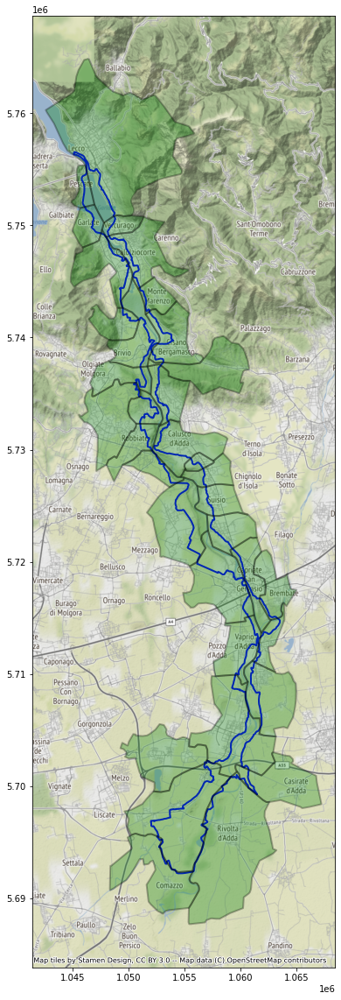

In [ ]:
ax = parco.to_crs(epsg=3857).plot(figsize=(20, 20), facecolor="none", edgecolor="b", linewidth=2)
comuni_parco.to_crs(epsg=3857).plot(ax=ax, facecolor="g", linewidth=2, alpha=0.3, edgecolor="k")
contextily.add_basemap(ax=ax)

**4. dato il nome di un parco, avere la mappa del parco con le province che attraversa**

Inserire il nome di un parco lombardo: Parco Adda Nord


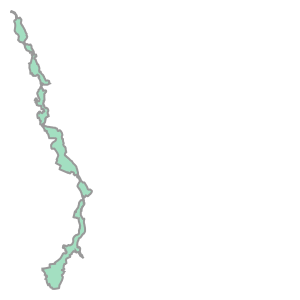

In [ ]:
parco1 = input('Inserire il nome di un parco lombardo: ')
parco1 = parchi[parchi["NOME"] == parco1]
squeeze_parco1 = parco1.geometry.squeeze()
squeeze_parco1

In [ ]:
province_parco =  province[province.intersects(squeeze_parco1)]
province_parco

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Leng,Shape_Area,geometry
14,1,3,15,215,215,-,Milano,Milano,MI,Citta metropolitana,309951.219188,1.575033e+09,"MULTIPOLYGON (((538136.289 5004372.814, 539162..."
15,1,3,16,0,16,Bergamo,-,Bergamo,BG,Provincia,310847.260446,2.754672e+09,"POLYGON ((585288.233 5104483.085, 585414.669 5..."
18,1,3,19,0,19,Cremona,-,Cremona,CR,Provincia,365500.445250,1.769382e+09,"POLYGON ((542189.537 5037362.585, 542408.347 5..."
96,1,3,97,0,97,Lecco,-,Lecco,LC,Provincia,181294.401343,8.056511e+08,"POLYGON ((532079.618 5104664.092, 533286.608 5..."
97,1,3,98,0,98,Lodi,-,Lodi,LO,Provincia,234944.113661,7.819878e+08,"POLYGON ((534551.968 5035118.603, 534818.280 5..."
103,1,3,108,0,108,Monza e della Brianza,-,Monza e della Brianza,MB,Provincia,126272.490811,4.055793e+08,"POLYGON ((519754.706 5065242.380, 520199.702 5..."


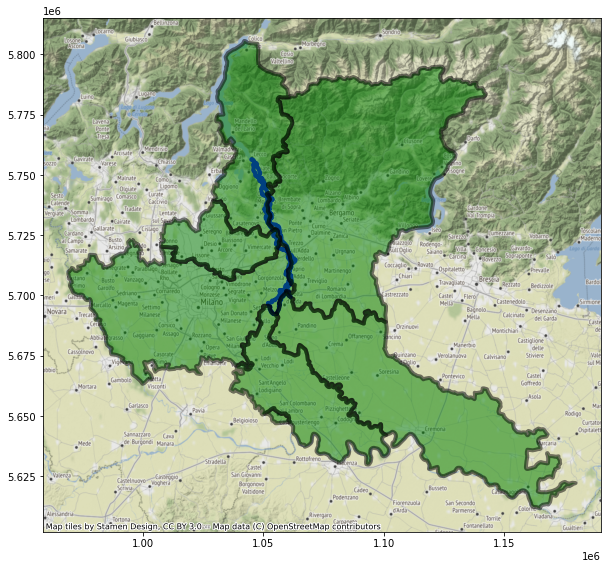

In [ ]:
ax = parco1.to_crs(epsg=3857).plot(figsize=(10, 10), facecolor="none", edgecolor="b", linewidth=4)
province_parco.to_crs(epsg=3857).plot(ax=ax, facecolor="g", linewidth=4, alpha=0.5, edgecolor="k")
contextily.add_basemap(ax=ax)

**5. dato un comune, avere i parchi che ospita (elenco e mappa)**

Inserire il nome di un comune lombardo: Milano
Parchi ospitati dal comune Milano: 
 20    Parco Nord Milano
21     Parco Sud Milano
Name: NOME, dtype: object


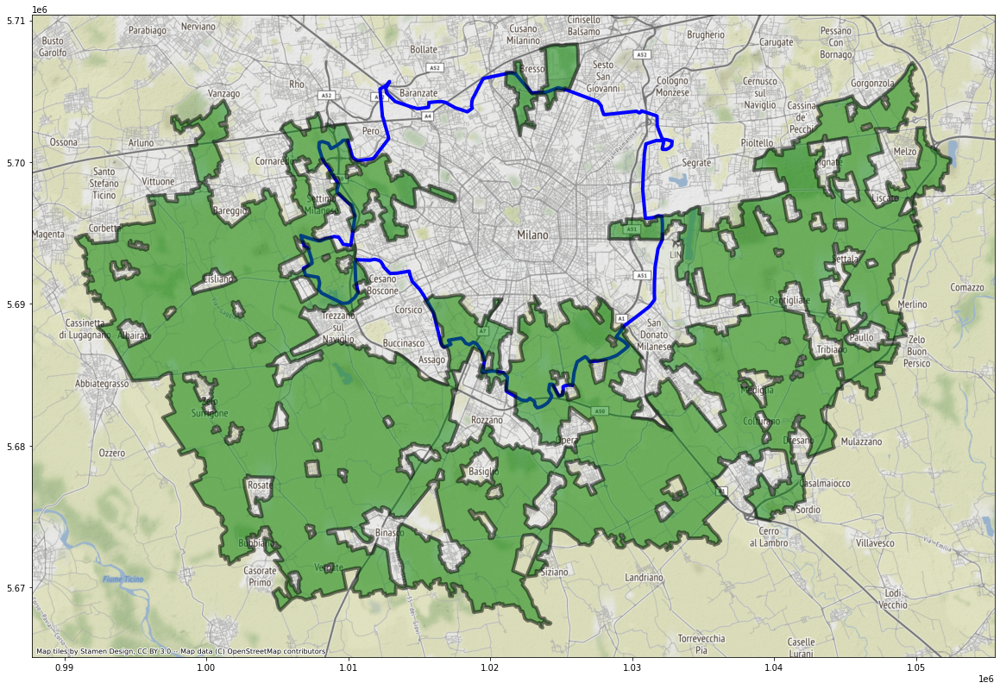

In [ ]:
n_comune = input('Inserire il nome di un comune lombardo: ')
comune1 = comuni[comuni["COMUNE"] == n_comune]
squeeze_comune= comune1.geometry.squeeze()

parchi_comune =  parchi[parchi.intersects(squeeze_comune)]
parchi_comune

print("Parchi ospitati dal comune " + n_comune + ": \n",parchi_comune.NOME)

ax = comune1.to_crs(epsg=3857).plot(figsize=(20, 20), facecolor="none", edgecolor="b", linewidth=4)
parchi_comune.to_crs(epsg=3857).plot(ax=ax, facecolor="g", linewidth=4, alpha=0.5, edgecolor="k")
contextily.add_basemap(ax=ax)

**6. dato il nome di una provincia, avere i parchi che ospita (elenco e mappa)**

Inserire il nome di una provincia lombarda: Milano
Parchi opsitati nella provincia di  Milano : 
 8            Parco Adda Nord
9     Parco Valle del Ticino
18        Parco delle Groane
20         Parco Nord Milano
21          Parco Sud Milano
22            Parco Adda Sud
24          Parco Sud Milano
Name: NOME, dtype: object


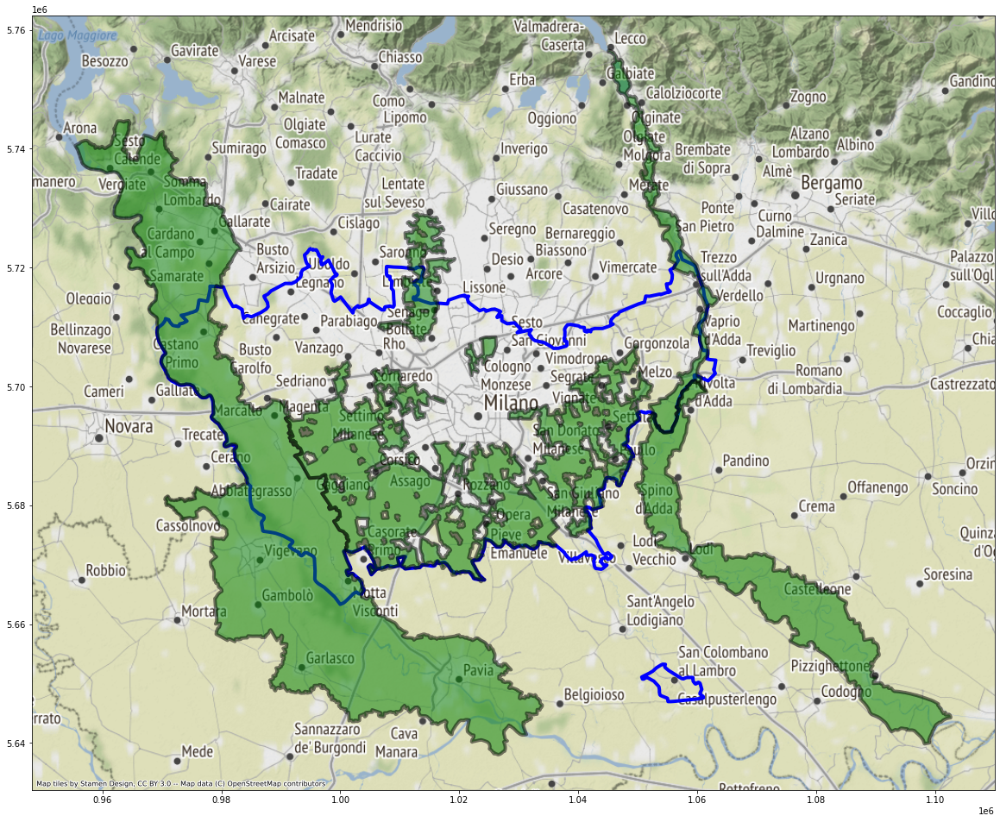

In [ ]:
n_provincia = input('Inserire il nome di una provincia lombarda: ')
provincia = province[province["DEN_UTS"] == n_provincia]
squeeze_provincia = provincia.geometry.squeeze()

parchi_nella_provincia =  parchi[parchi.intersects(squeeze_provincia)]
parchi_nella_provincia

print("Parchi opsitati nella provincia di ", n_provincia, ": \n", parchi_nella_provincia.NOME)

ax = provincia.to_crs(epsg=3857).plot(figsize=(20, 20), facecolor="none", edgecolor="b", linewidth=4)
parchi_nella_provincia.to_crs(epsg=3857).plot(ax=ax, facecolor="g", linewidth=4, alpha=0.5, edgecolor="k")
contextily.add_basemap(ax=ax)